# Preprocesamiento del corpus

El corpus crudo entra al reparto sin filtro: la mitad de las imágenes viene de
observaciones con varias fotos del mismo individuo, y nada descarta las desenfocadas ni las
quemadas. Aquí se recorta cada mariposa a un cuadrado, se miden nitidez y exposición, se
eliminan los casi-duplicados y se escribe el dataset ya repartido 70/20/10.

Cada foto sale con un veredicto y un motivo, de modo que el descarte es auditable.

La detección necesita `ultralytics`, que no está entre las dependencias del resto del
repositorio. Las dos pasadas caras guardan en `cache/` y se retoman donde quedaron, así que
interrumpir el kernel no pierde trabajo.

In [1]:
import json
from collections import Counter

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from corpus import FIGURAS, SPLITS_DIR, calidad, deteccion, duplicados
from corpus import preprocesamiento as pre
from corpus.dataSplits import contar, publicar, repartir

SEMILLA = 42

## Detección

YOLO-World acepta clases por texto, así que resuelve lo que un YOLO entrenado en COCO no
puede: COCO no tiene clase de mariposa. La cuarta clase es la cadena vacía, un sumidero de
fondo. Sin ella el modelo deja diez de cada cuarenta fotos sin caja; con ella, una. Nunca
gana, solo recalibra el reparto de confianza.

In [2]:
modelo = deteccion.cargarModelo()
prueba = deteccion.detectarLote(modelo, deteccion.rutasDelCorpus()[:24])
print(f"{len(prueba)} imágenes · {sum(1 for f in prueba if f['x1'] == '')} sin detección")

24 imágenes · 0 sin detección


La pasada completa tarda algo más de una hora, a unos 0,28 s por imagen.

In [3]:
detecciones = deteccion.detectarCorpus(modelo=modelo)
tabla = pd.DataFrame(detecciones)
sinCaja = tabla["x1"].eq("").sum()
print(f"{len(tabla)} imágenes · {sinCaja} sin detección ({100 * sinCaja / len(tabla):.1f} %)")

0 en caché · 14485 pendientes
  640/14485 · 0.27 s/img · faltan 62 min
  1280/14485 · 0.29 s/img · faltan 63 min
  1920/14485 · 0.32 s/img · faltan 68 min
  2560/14485 · 0.35 s/img · faltan 70 min
  3200/14485 · 0.37 s/img · faltan 69 min
  3840/14485 · 0.37 s/img · faltan 66 min
  4480/14485 · 0.37 s/img · faltan 61 min
  5120/14485 · 0.36 s/img · faltan 57 min
  5760/14485 · 0.36 s/img · faltan 53 min
  6400/14485 · 0.36 s/img · faltan 49 min
  7040/14485 · 0.36 s/img · faltan 45 min
  7680/14485 · 0.36 s/img · faltan 41 min
  8320/14485 · 0.36 s/img · faltan 37 min
  8960/14485 · 0.36 s/img · faltan 33 min
  9600/14485 · 0.36 s/img · faltan 29 min
  10240/14485 · 0.36 s/img · faltan 25 min
  10880/14485 · 0.36 s/img · faltan 22 min
  11520/14485 · 0.36 s/img · faltan 18 min
  12160/14485 · 0.36 s/img · faltan 14 min
  12800/14485 · 0.36 s/img · faltan 10 min
  13440/14485 · 0.36 s/img · faltan 6 min
  14080/14485 · 0.36 s/img · faltan 2 min
  14485/14485 · 0.36 s/img · faltan 0 min


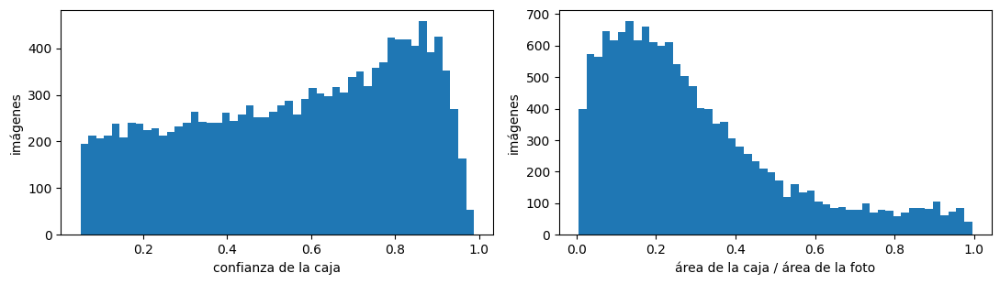

In [4]:
numerica = tabla[["x1", "y1", "x2", "y2", "confianza"]].apply(pd.to_numeric, errors="coerce")
areas = ((numerica["x2"] - numerica["x1"]) * (numerica["y2"] - numerica["y1"])
         / (tabla["ancho"].astype(float) * tabla["alto"].astype(float))).dropna()

figura, ejes = plt.subplots(1, 2, figsize=(11, 3.2))
ejes[0].hist(numerica["confianza"].dropna(), bins=50)
ejes[0].set_xlabel("confianza de la caja")
ejes[1].hist(areas, bins=50)
ejes[1].set_xlabel("área de la caja / área de la foto")
for eje in ejes:
    eje.set_ylabel("imágenes")
figura.tight_layout()
plt.show()

En rojo la caja del detector, en verde el cuadrado que se recortará. El cuadrado lleva un
margen del 15 % y, al topar con un borde, se desplaza en vez de rellenarse: un borde negro
sería una textura sintética que la red aprendería como atajo, y perder unos píxeles de ala
no lo es.

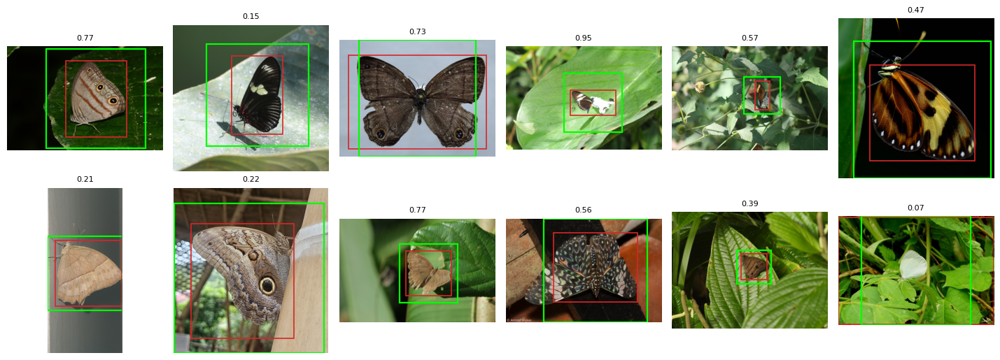

In [5]:
def rejilla(filas, dibujarCajas=False, titulo=None, columnas=6):
    filas = list(filas)
    if not filas:
        print("sin imágenes")
        return
    alto = (len(filas) + columnas - 1) // columnas
    figura, ejes = plt.subplots(alto, columnas, figsize=(2.4 * columnas, 2.6 * alto),
                                squeeze=False)
    for eje, fila in zip(ejes.ravel(), filas):
        imagen = cv2.imread(str(deteccion.IMAGENES / fila["especie"] / fila["archivo"]))
        cuadrado = deteccion.cuadradoDe(fila)
        if not dibujarCajas and cuadrado:
            imagen = deteccion.recortar(imagen, *cuadrado)
        eje.imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
        eje.axis("off")
        if cuadrado is None:
            eje.set_title("sin detección", fontsize=8, color="tab:red")
        elif dibujarCajas:
            caja = [float(fila[c]) for c in ("x1", "y1", "x2", "y2")]
            eje.add_patch(plt.Rectangle((caja[0], caja[1]), caja[2] - caja[0],
                                        caja[3] - caja[1], fill=False, color="tab:red", lw=1.2))
            eje.add_patch(plt.Rectangle(cuadrado[:2], cuadrado[2], cuadrado[2],
                                        fill=False, color="lime", lw=1.6))
            eje.set_title(f"{float(fila['confianza']):.2f}", fontsize=8)
        elif fila.get("nitidez"):
            eje.set_title(f"nitidez {float(fila['nitidez']):.0f}", fontsize=8)
    for eje in ejes.ravel()[len(filas):]:
        eje.axis("off")
    if titulo:
        figura.suptitle(titulo, fontsize=10)
    figura.tight_layout()
    plt.show()


rejilla(tabla.sample(12, random_state=SEMILLA).to_dict("records"), dibujarCajas=True)

Las que quedaron sin caja. Si son mariposas reales, el detector falló y el descarte pierde
material bueno; si son corteza, hojas y fotos de paisaje, el descarte es correcto. La
decisión se toma mirándolas.

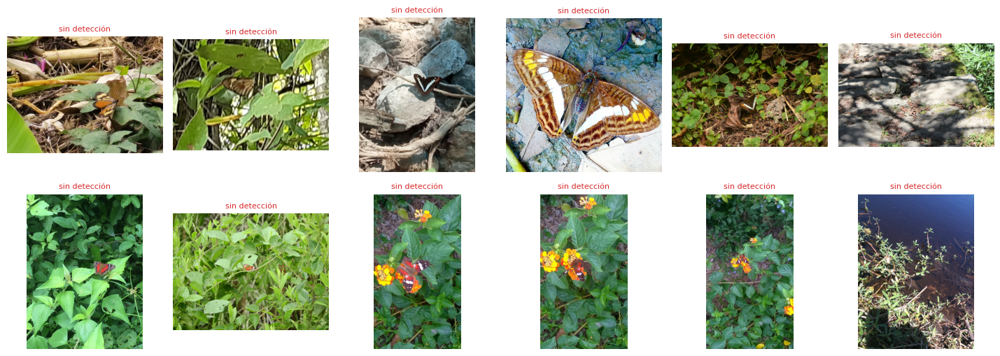

In [6]:
rejilla(tabla[tabla["x1"].eq("")].head(12).to_dict("records"), dibujarCajas=True)

## Calidad

La varianza del Laplaciano depende del tamaño de la imagen, así que no se mide sobre la
foto original sino sobre el recorte ya llevado a 384×384: solo entonces un umbral absoluto
significa lo mismo para todas. La exposición sale de la mediana del canal V y de la
fracción de píxeles quemados o negros.

In [7]:
metricas = calidad.medirCorpus(detecciones)
medidas = pd.DataFrame(metricas)
numericas = [c for c in medidas.columns if c not in ("photo_id", "phash", "dhash")]
medidas[numericas] = medidas[numericas].apply(pd.to_numeric)
medidas[["nitidez", "ladoOriginal", "fracSaturados", "fracNegros"]].describe().round(3)

0 en caché · 14485 pendientes
  500/14485
  1000/14485
  1500/14485
  2000/14485
  2500/14485
  3000/14485
  3500/14485
  4000/14485
  4500/14485
  5000/14485
  5500/14485
  6000/14485
  6500/14485
  7000/14485
  7500/14485
  8000/14485
  8500/14485
  9000/14485
  9500/14485
  10000/14485
  10500/14485
  11000/14485
  11500/14485
  12000/14485
  12500/14485
  13000/14485
  13500/14485
  14000/14485
→ /Users/cristiansandoval/Universidad/ButterflyDataset/cache/metricas.csv


,nitidez,ladoOriginal,fracSaturados,fracNegros
count,14076.000,14076.000,14076.000,14076.000
mean,547.100,576.636,0.027,0.011
std,689.437,195.218,0.062,0.055
min,1.555,37.000,0.000,0.000
25%,171.207,435.000,0.000,0.000
50%,350.297,594.500,0.005,0.000
75%,659.719,734.000,0.027,0.000
max,13899.924,1024.000,0.957,0.754


Los umbrales arrancan en un percentil del propio corpus y se ajustan mirando la frontera.
El número que queda se congela como literal en `corpus/calidad.py`: recalcular el percentil
cambiaría el dataset cada vez que el corpus crece.

In [8]:
sugeridos = {
    "nitidez": calidad.umbralPorPercentil(medidas["nitidez"], 5),
    "fracSaturados": calidad.umbralPorPercentil(medidas["fracSaturados"], 99),
    "fracNegros": calidad.umbralPorPercentil(medidas["fracNegros"], 99),
    "ladoOriginal": calidad.umbralPorPercentil(medidas["ladoOriginal"], 2),
}
pd.DataFrame({"percentil": sugeridos, "congelado": calidad.UMBRALES}).round(3)

,percentil,congelado
nitidez,45.692,60.00
fracSaturados,0.285,0.06
fracNegros,0.332,0.20
ladoOriginal,170.000,200.00


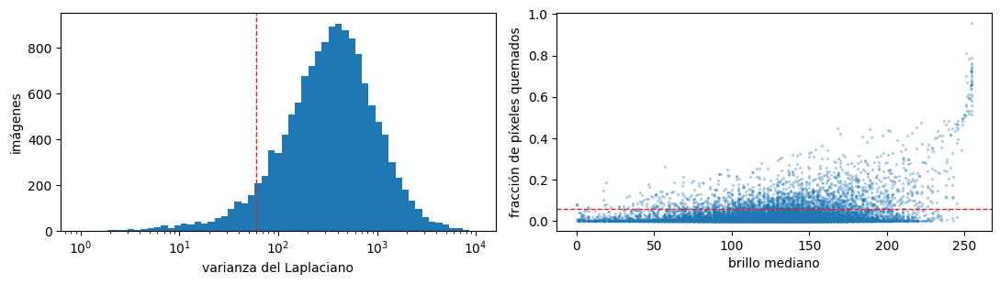

In [9]:
figura, ejes = plt.subplots(1, 2, figsize=(11, 3.2))
ejes[0].hist(medidas["nitidez"], bins=np.logspace(0, 4, 60))
ejes[0].set_xscale("log")
ejes[0].axvline(calidad.UMBRALES["nitidez"], linestyle="--", linewidth=1, color="tab:red")
ejes[0].set_xlabel("varianza del Laplaciano")
ejes[0].set_ylabel("imágenes")
ejes[1].scatter(medidas["brillo"], medidas["fracSaturados"], s=2, alpha=0.25)
ejes[1].axhline(calidad.UMBRALES["fracSaturados"], linestyle="--", linewidth=1, color="tab:red")
ejes[1].set_xlabel("brillo mediano")
ejes[1].set_ylabel("fracción de píxeles quemados")
figura.tight_layout()
plt.show()

La frontera de nitidez: las seis justo por debajo del corte y las seis justo por encima. Si
las de abajo se ven bien, el umbral está tirando material bueno; si las de arriba se ven
borrosas, se queda corto. Es la figura que justifica el número.

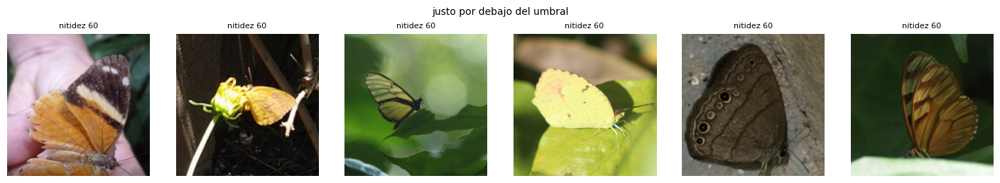

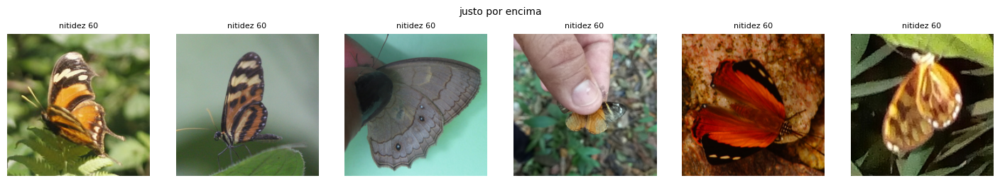

In [10]:
conRecorte = medidas.merge(tabla, on="photo_id").sort_values("nitidez")
umbral = calidad.UMBRALES["nitidez"]
rejilla(conRecorte[conRecorte["nitidez"] < umbral].tail(6).to_dict("records"),
        titulo="justo por debajo del umbral")
rejilla(conRecorte[conRecorte["nitidez"] >= umbral].head(6).to_dict("records"),
        titulo="justo por encima")

## Duplicados

Dos fotos de la misma observación suelen ser el mismo individuo con segundos de diferencia;
al repartir por imagen caen a la vez en entrenamiento y prueba. El `observation_id` da un
conjunto de validación gratuito: si las distancias dentro de una observación se agrupan
cerca de cero y las de observaciones distintas quedan lejos, el valle entre ambas modas es
el umbral, y deja de ser un número arbitrario.

Los hashes se calculan sobre el recorte, no sobre la foto entera, porque dos disparos con
encuadre distinto se vuelven casi idénticos una vez recortados. Se elimina el
casi-duplicado, no se agrupa por observación: así el dorsal y el ventral de un mismo
ejemplar, que son fotos genuinamente distintas, sobreviven.

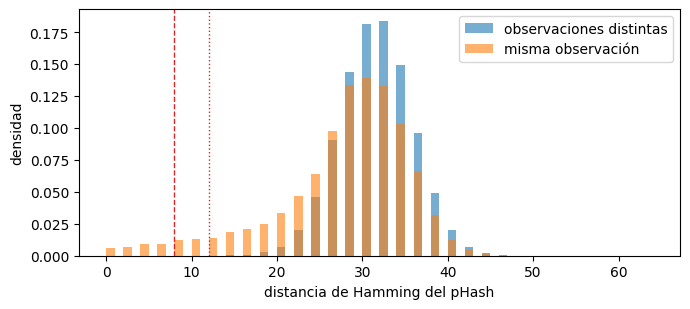

mediana intra 28 · mediana inter 32


In [11]:
auditoria = pre.construirAuditoria(detecciones, metricas)
intra, inter = duplicados.validarUmbral([f for f in auditoria if f["phash"]])

figura, eje = plt.subplots(figsize=(7, 3.2))
eje.hist(inter, bins=range(65), density=True, alpha=0.6, label="observaciones distintas")
eje.hist(intra, bins=range(65), density=True, alpha=0.6, label="misma observación")
eje.axvline(duplicados.UMBRAL, linestyle="--", linewidth=1, color="tab:red")
eje.axvline(duplicados.UMBRAL_RAFAGA, linestyle=":", linewidth=1, color="tab:red")
eje.set_xlabel("distancia de Hamming del pHash")
eje.set_ylabel("densidad")
eje.legend()
figura.tight_layout()
plt.show()

print(f"mediana intra {np.median(intra):.0f} · mediana inter {np.median(inter):.0f}")

Un grupo de casi-duplicados, ordenado por nitidez: se conserva el primero.

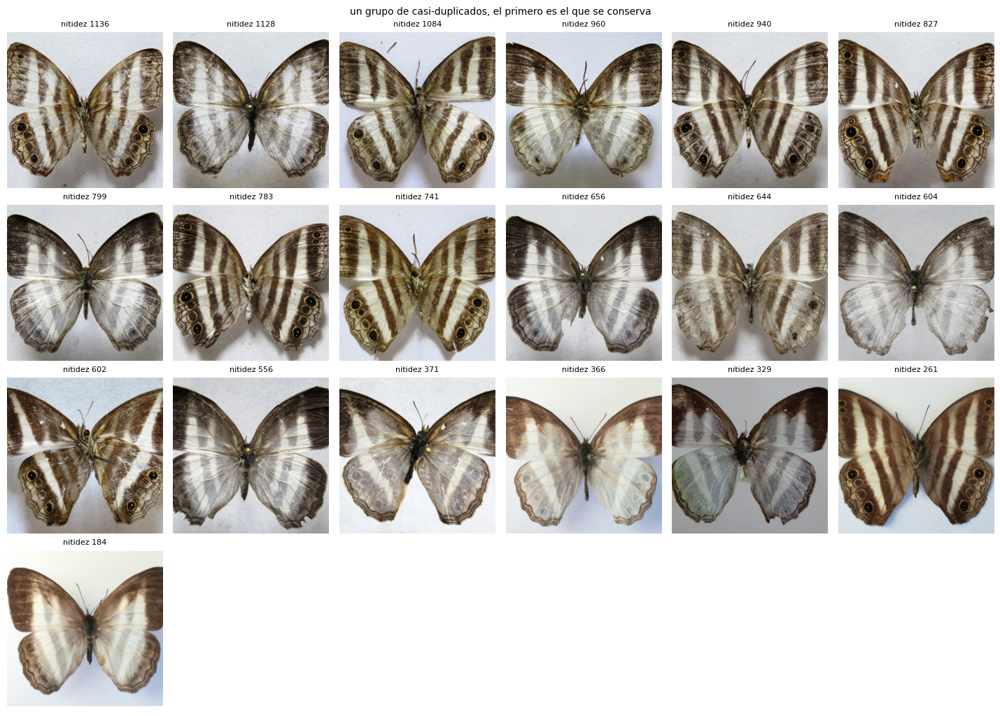

In [12]:
porGrupo = pd.DataFrame(auditoria)
porGrupo = porGrupo[porGrupo["grupo"] != ""]
if len(porGrupo):
    mayor = porGrupo["grupo"].value_counts().index[0]
    rejilla(porGrupo[porGrupo["grupo"].eq(mayor)]
            .sort_values("nitidez", ascending=False).to_dict("records"),
            titulo="un grupo de casi-duplicados, el primero es el que se conserva")

## Veredictos

Los motivos son excluyentes y en cascada: el primero que aplica gana, de modo que la tabla
suma el corpus entero sin doble contabilidad. La deduplicación va al final a propósito,
para que el representante que se conserva ya haya pasado los filtros de calidad.

In [13]:
resumen = pd.DataFrame(pre.resumenPorMotivo(auditoria)).set_index("motivo")
print(f"total {resumen['imagenes'].sum()} de {len(auditoria)} filas")
resumen

total 14485 de 14485 filas


,imagenes,porcentaje
motivo,,
sin_deteccion,409,2.82
recorte_pequeno,457,3.15
desenfocada,652,4.50
sobreexpuesta,1717,11.85
subexpuesta,213,1.47
casi_duplicado,590,4.07
especie_escasa,129,0.89
aceptada,10318,71.23


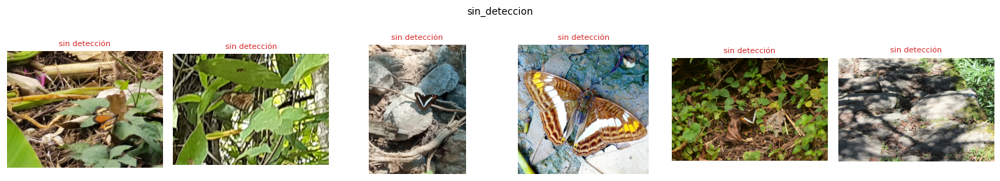

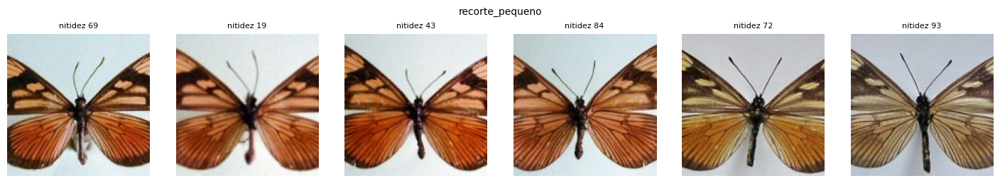

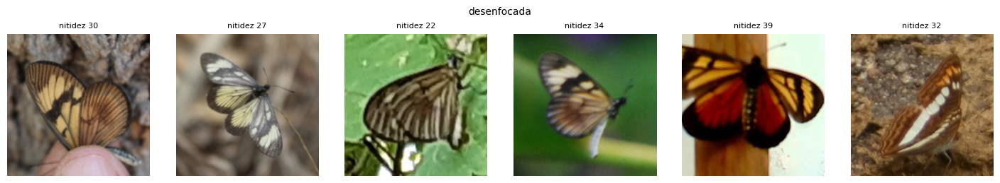

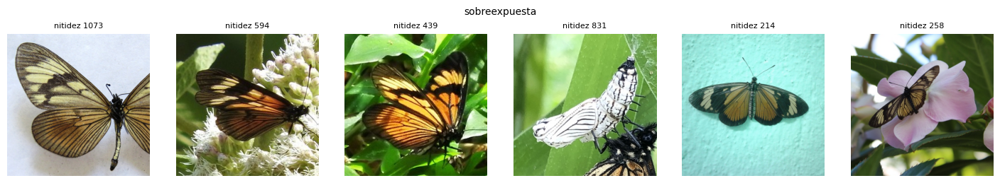

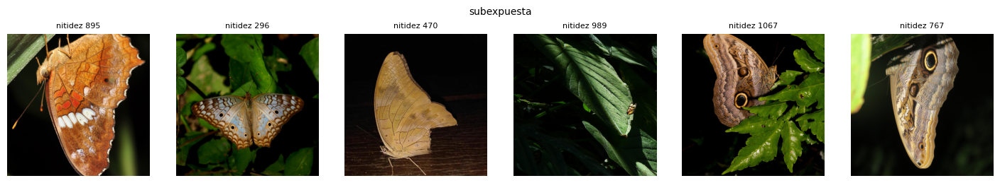

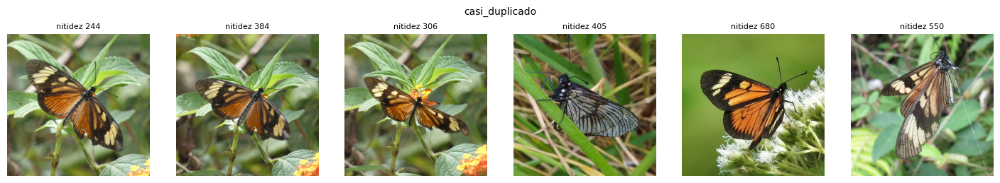

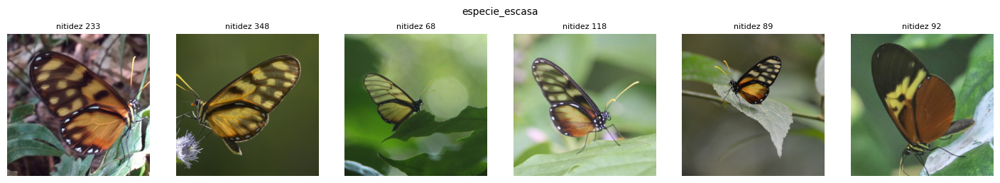

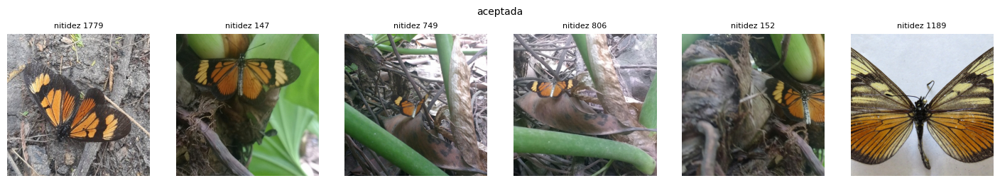

In [14]:
porMotivo = pd.DataFrame(auditoria)
for motivo in pre.MOTIVOS:
    muestra = porMotivo[porMotivo["motivo"].eq(motivo)]
    if len(muestra):
        rejilla(muestra.head(6).to_dict("records"), titulo=motivo)

## Partición

Se reutiliza `repartir()` con su invariante intacto: la semilla se combina con el nombre de
la especie, así que agregar una especie no altera el reparto de las que ya estaban. Lo
único nuevo es que reparte la lista de imágenes aceptadas en vez de leer el disco.

In [15]:
aceptadas = pre.aceptadasPorEspecie(auditoria)
reparto = repartir(sorted(aceptadas), semilla=SEMILLA, archivosPorEspecie=aceptadas)
pre.anotarSplit(auditoria, reparto)
print(f"{len(reparto)} clases · {contar(reparto)}")
print(f"→ {publicar(reparto, SEMILLA, nombre=f'procesado_semilla{SEMILLA}.json')}")

79 clases · {'train': 7218, 'test': 2062, 'validate': 1038, 'total': 10318}
→ /Users/cristiansandoval/Universidad/ButterflyDataset/splits/procesado_semilla42.json


La fuga es el problema que motivó todo esto: qué fracción de las imágenes de prueba tiene
una hermana de la misma observación en entrenamiento.

In [16]:
crudo = json.loads((SPLITS_DIR / f"semilla{SEMILLA}.json").read_text())["reparto"]
pd.DataFrame([
    {"partición": "corpus crudo", "imágenes": contar(crudo)["total"],
     "fuga en test (%)": round(pre.medirFuga(crudo), 1)},
    {"partición": "dataset procesado", "imágenes": contar(reparto)["total"],
     "fuga en test (%)": round(pre.medirFuga(reparto), 1)},
]).set_index("partición")

,imágenes,fuga en test (%)
partición,,
corpus crudo,14485,41.0
dataset procesado,10318,31.4


## Balance

Cuánto perdió cada especie. La comparación importa más que el total: un filtro que se lleva
por delante justo las especies escasas empeora el desbalance que el corpus ya tenía.

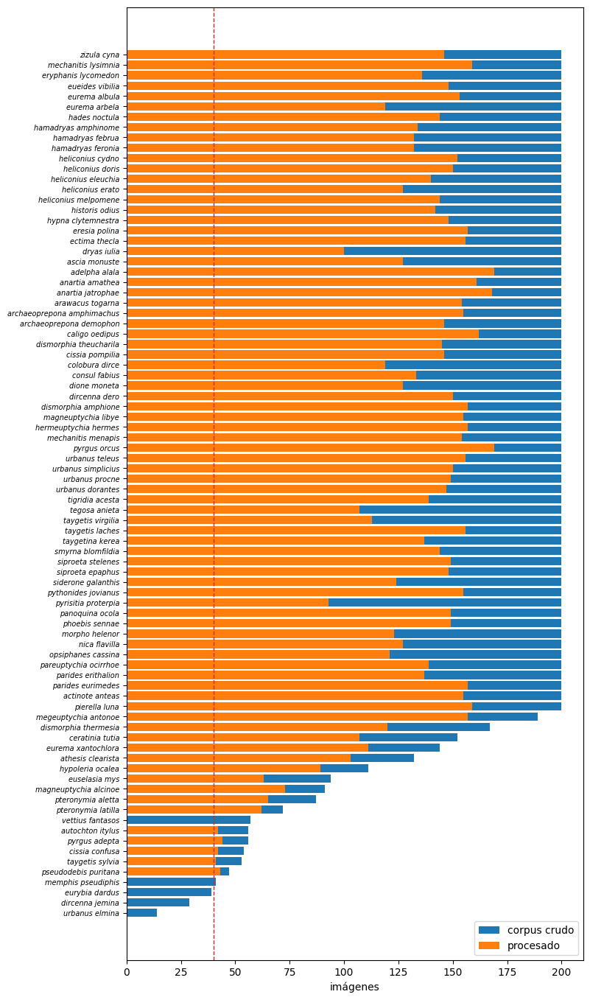

In [17]:
antes = pd.Series(Counter(f["especie"] for f in auditoria))
despues = pd.Series({e: len(a) for e, a in aceptadas.items()}).reindex(antes.index).fillna(0)
orden = antes.sort_values().index
etiquetas = [e.replace("_", " ") for e in orden]

figura, eje = plt.subplots(figsize=(8, 0.2 * len(orden)))
eje.barh(etiquetas, antes[orden], label="corpus crudo")
eje.barh(etiquetas, despues[orden], label="procesado")
eje.set_yticks(range(len(etiquetas)), etiquetas, style="italic", fontsize=7)
eje.axvline(pre.MINIMO_POR_ESPECIE, linestyle="--", linewidth=1, color="tab:red")
eje.set_xlabel("imágenes")
eje.legend(loc="lower right")
FIGURAS.mkdir(exist_ok=True)
figura.savefig(FIGURAS / "balance_procesado.png", bbox_inches="tight")
plt.show()

In [18]:
perdida = pd.DataFrame({"antes": antes, "despues": despues.astype(int)})
perdida["perdidas"] = perdida["antes"] - perdida["despues"]
perdida["porcentaje"] = (100 * perdida["perdidas"] / perdida["antes"]).round(1)
perdida.sort_values("porcentaje", ascending=False).head(10)

,antes,despues,perdidas,porcentaje
dircenna_jemina,29,0,29,100.0
eurybia_dardus,39,0,39,100.0
vettius_fantasos,57,0,57,100.0
urbanus_elmina,14,0,14,100.0
memphis_pseudiphis,41,0,41,100.0
pyrisitia_proterpia,200,93,107,53.5
dryas_iulia,200,100,100,50.0
tegosa_anieta,200,107,93,46.5
taygetis_virgilia,200,113,87,43.5
eurema_arbela,200,119,81,40.5


## Escritura

El dataset sale a `Dataset/<split>/<especie>/`, recortado y a 448×448. Como las imágenes
son obras de terceros y pesan gigas, la carpeta no va a git; lo que se versiona es
`auditoria.csv`, la receta que permite reconstruirla y explicar cada descarte.

In [19]:
pre.escribirAuditoria(auditoria)
escritas = pre.escribirDataset(auditoria)
print(f"aceptadas {sum(1 for f in auditoria if f['veredicto'] == 'aceptada')} · "
      f"escritas {sum(escritas.values())}")

→ /Users/cristiansandoval/Universidad/ButterflyDataset/auditoria.csv
→ /Users/cristiansandoval/Universidad/ButterflyDataset/Dataset · train 7218 · test 2062 · validate 1038
aceptadas 10318 · escritas 10318
